# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [4]:
splitfolders.ratio(loc,output = "output1",ratio = (0.80,0.10,0.10))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [01:00, 69.38 files/s] 

There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 105 images in './output1/test/cataract'.
There are 0 directories and 111 images in './output1/test/diabetic_retinopathy'.
There are 0 directories and 102 images in './output1/test/glaucoma'.
There are 0 directories and 108 images in './output1/test/normal'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 103 images in './output1/val/cataract'.
There are 0 directories and 109 images in './output1/val/diabetic_retinopathy'.
There are 0 directories and 100 images in './output1/val/glaucoma'.
There are 0 directories and 107 images in './output1/val/normal'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 830 images in './output1/train/cataract'.
There are 0 directories and 878 images in './output1/train/diabetic_retinopathy'.
There are 0 directories and 805 images in './output1/

# **Batch size: 16**

In [5]:
epoch = 20
batchsize = 16

In [6]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


In [7]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [8]:
data_aug = tf.keras.Sequential([
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomFlip("horizontal")
],name = "data_augmentation_layer")

In [9]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **EfficientNetV2B3 Model**

In [10]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


52606240/52606240 [==============================] - 0s 0us/step


In [11]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1536)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 32)                49184     
                                                             

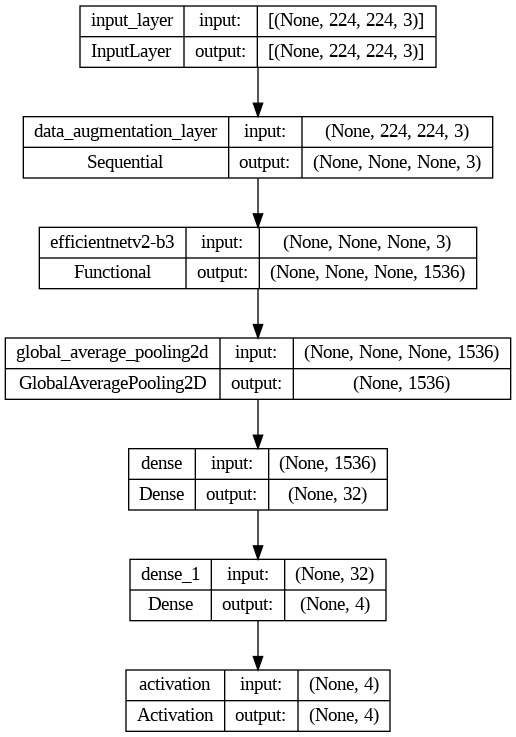

In [12]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [13]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [14]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 122s 501ms/step - loss: 0.6881 - accuracy: 0.7275 - val_loss: 0.6202 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 80s 380ms/step - loss: 0.5295 - accuracy: 0.7835 - val_loss: 0.5537 - val_accuracy: 0.7852 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 68s 320ms/step - loss: 0.4975 - accuracy: 0.8058 - val_loss: 0.7468 - val_accuracy: 0.7208 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 70s 333ms/step - loss: 0.4555 - accuracy: 0.8247 - val_loss: 0.5279 - val_accuracy: 0.8043 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 58s 273ms/step - loss: 0.4308 - accuracy: 0.8336 - val_loss: 0.5833 - val_accuracy: 0.7852 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 53s 250ms/step - loss: 0.4197 - accuracy: 0.8354 - val_loss: 0.5133 - val_accuracy: 0.8043 - lr: 0.0010
Epoch 7/20
211/211 [==============================]

EfficientNetV2B3 Evaluation

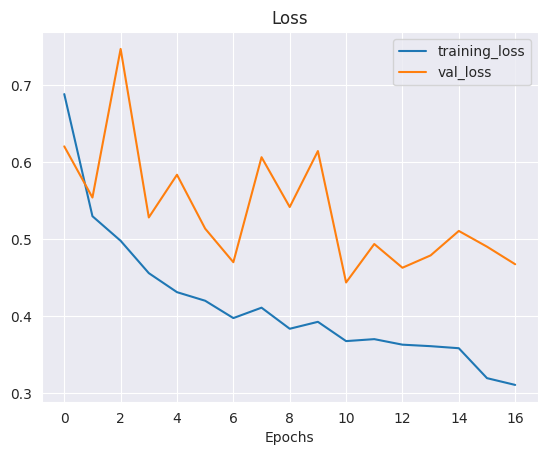

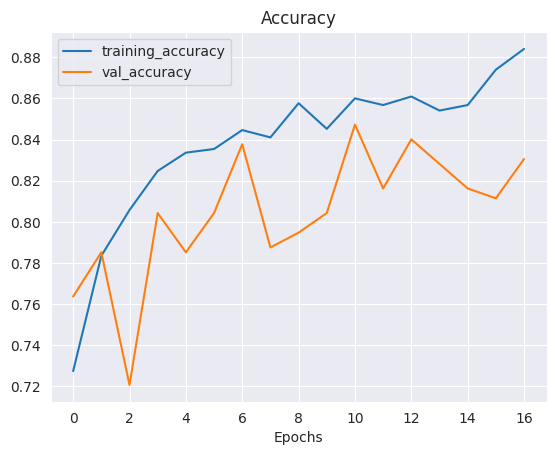

In [15]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 44ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       105
           1       0.84      0.93      0.88       111
           2       0.95      0.68      0.79       102
           3       0.73      0.88      0.80       108

    accuracy                           0.85       426
   macro avg       0.87      0.85      0.85       426
weighted avg       0.86      0.85      0.85       426

Specificity: [0.28700906344410876, 0.3188854489164087, 0.19327731092436976, 0.28700906344410876]
Mean Squared Error: : 0.12032827734947205
The average AUC-ROC is 0.9744856644141129


[0.9692307692307692,
 0.6546052631578947,
 0.7110481586402266,
 0.668918918918919,
 0.6584615384615384,
 0.9736842105263158,
 0.6855524079320113,
 0.652027027027027,
 0.7015384615384616,
 0.6907894736842105,
 0.9065155807365439,
 0.722972972972973,
 0.6707692307692308,
 0.680921052631579,
 0.6968838526912181,
 0.956081081081081]

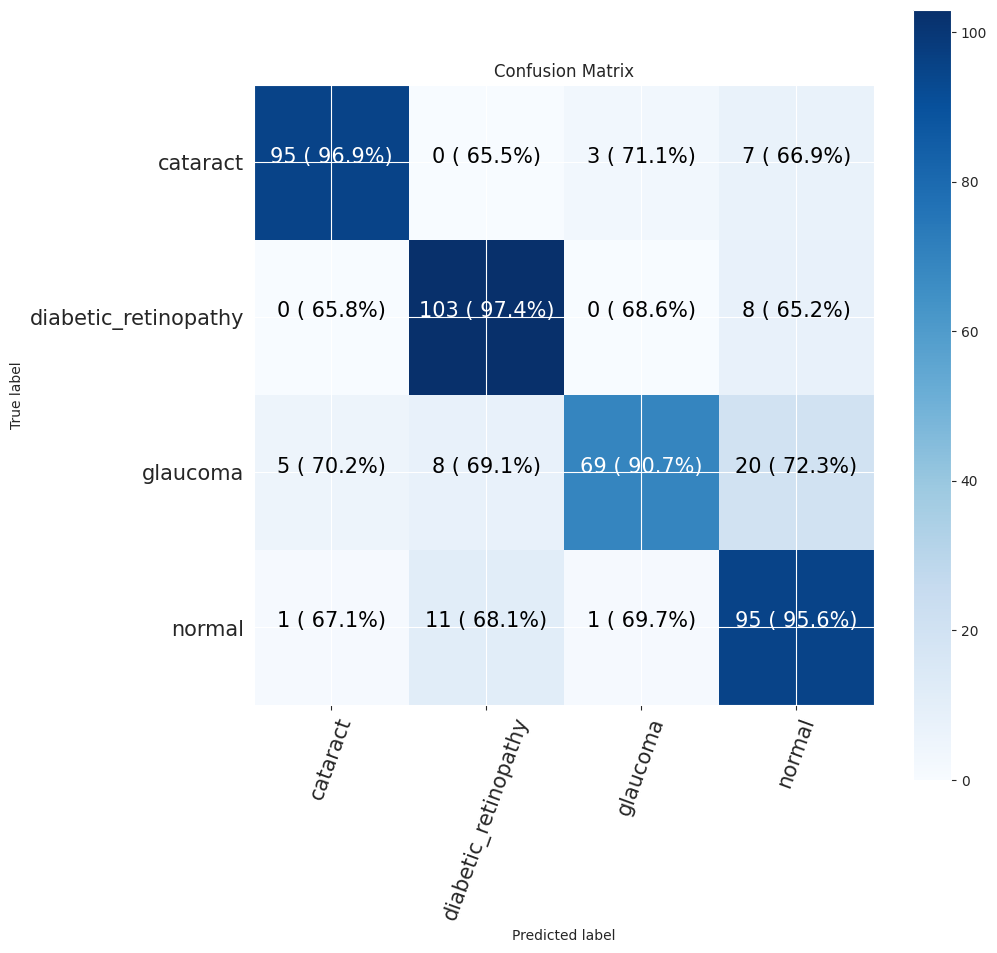

In [16]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


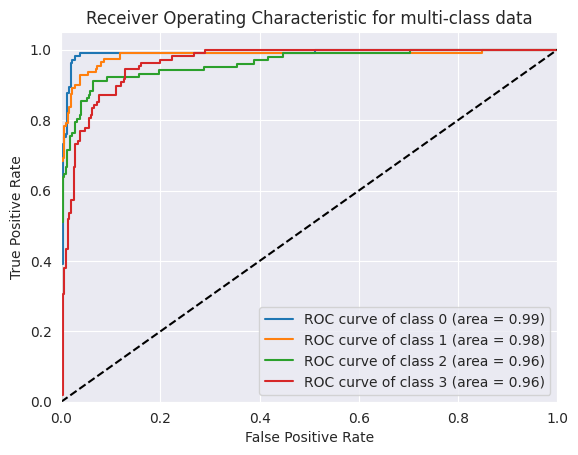

In [17]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [18]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

rbg = layers.Input(shape=(224, 224, 3))

rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

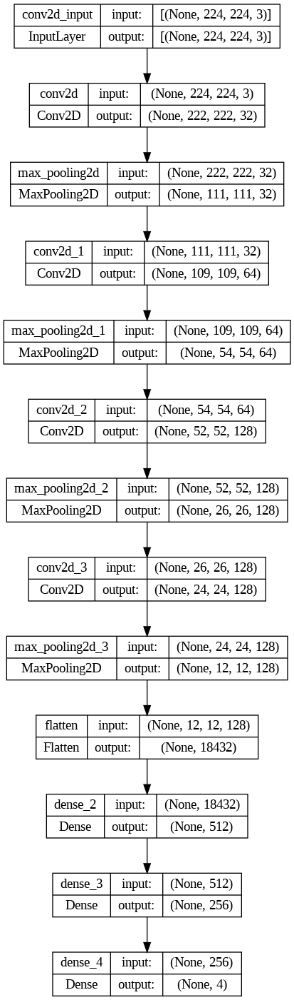

In [19]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [20]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [21]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 10s 28ms/step - loss: 0.9579 - accuracy: 0.5575 - val_loss: 0.3258 - val_accuracy: 0.6897 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 5s 23ms/step - loss: 0.3167 - accuracy: 0.6690 - val_loss: 0.2900 - val_accuracy: 0.7088 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 5s 23ms/step - loss: 0.3007 - accuracy: 0.6886 - val_loss: 0.2878 - val_accuracy: 0.7446 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2846 - accuracy: 0.7159 - val_loss: 0.2758 - val_accuracy: 0.7446 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2766 - accuracy: 0.7230 - val_loss: 0.2829 - val_accuracy: 0.7232 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2728 - accuracy: 0.7286 - val_loss: 0.2660 - val_accuracy: 0.7566 - lr: 0.0010
Epoch 7/20
211/211 [==============================] - 5s 23ms/s

CNN Evaluation

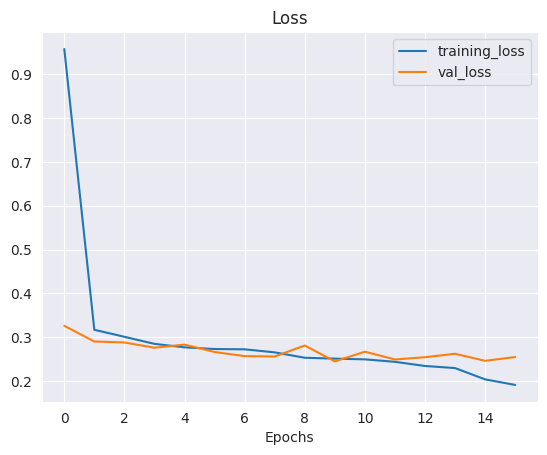

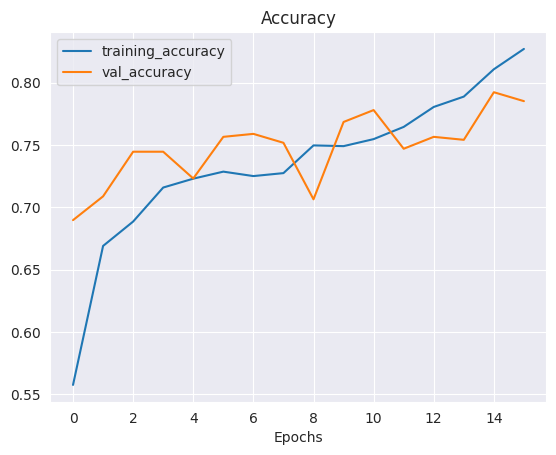

In [22]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 0s 10ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.42      0.49       105
           1       1.00      0.99      1.00       111
           2       0.55      0.56      0.56       102
           3       0.71      0.91      0.80       108

    accuracy                           0.73       426
   macro avg       0.71      0.72      0.71       426
weighted avg       0.72      0.73      0.72       426

Specificity: [0.11518324607329843, 0.34810126582278483, 0.15447154471544716, 0.29878048780487804]
Mean Squared Error: : 0.13298307359218597
The average AUC-ROC is 0.8964958020048246


[0.8262108262108262,
 0.6677215189873418,
 0.7894736842105263,
 0.71875,
 0.6837606837606838,
 0.9968354430379747,
 0.6594427244582043,
 0.6145833333333334,
 0.792022792022792,
 0.6772151898734177,
 0.8606811145510835,
 0.7013888888888888,
 0.698005698005698,
 0.6582278481012658,
 0.6904024767801857,
 0.9652777777777778]

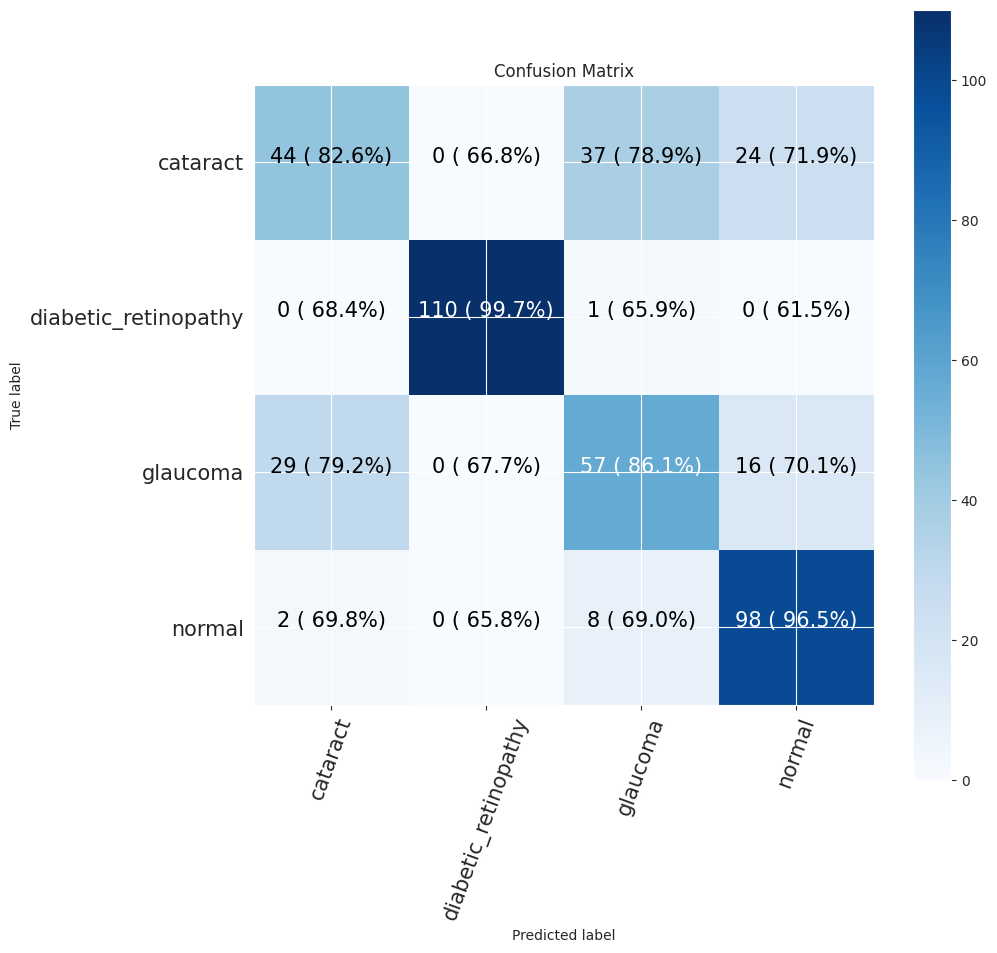

In [23]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


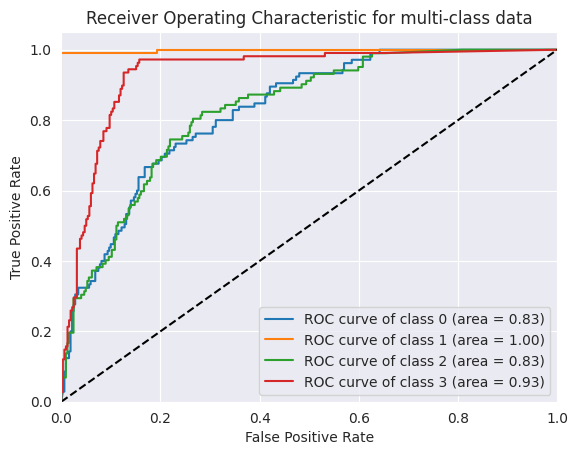

In [24]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [25]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [26]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


94765736/94765736 [==============================] - 1s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_4 (Conv2D)           (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_5 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_6 (Dense)             (None, 4)                 4100 

In [27]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

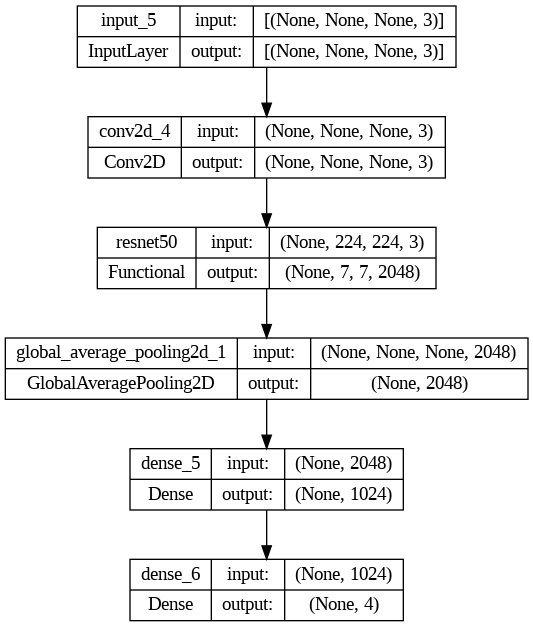

In [28]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [29]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [30]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 41s 158ms/step - loss: 0.2614 - accuracy: 0.7841 - val_loss: 0.1439 - val_accuracy: 0.9069 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 29s 136ms/step - loss: 0.1572 - accuracy: 0.8772 - val_loss: 0.1251 - val_accuracy: 0.9117 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 29s 136ms/step - loss: 0.1379 - accuracy: 0.8923 - val_loss: 0.1215 - val_accuracy: 0.8998 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 29s 137ms/step - loss: 0.1216 - accuracy: 0.9060 - val_loss: 0.1197 - val_accuracy: 0.9045 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 29s 137ms/step - loss: 0.1096 - accuracy: 0.9101 - val_loss: 0.1123 - val_accuracy: 0.8998 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 29s 139ms/step - loss: 0.0964 - accuracy: 0.9256 - val_loss: 0.1115 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

ResNet50 Evaluation

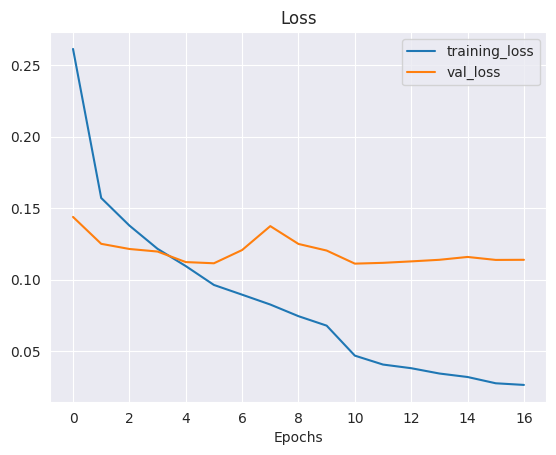

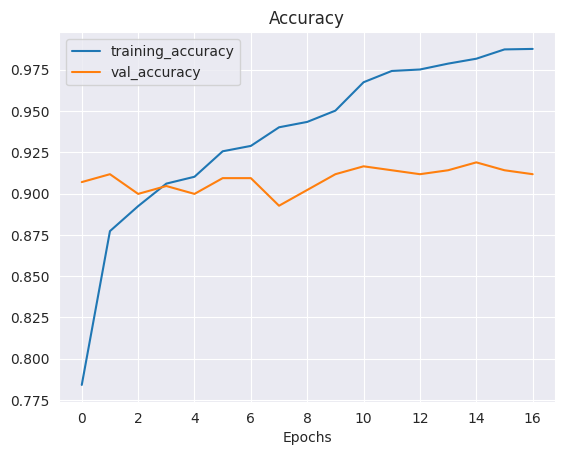

In [31]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 49ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       105
           1       1.00      1.00      1.00       111
           2       0.86      0.89      0.88       102
           3       0.91      0.87      0.89       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.31076923076923074, 0.3523809523809524, 0.2716417910447761, 0.28313253012048195]
Mean Squared Error: : 0.10278681665658951
The average AUC-ROC is 0.9878443921042798


[0.9875,
 0.6666666666666666,
 0.68125,
 0.6780185758513931,
 0.653125,
 1.0,
 0.653125,
 0.6563467492260062,
 0.690625,
 0.6761904761904762,
 0.965625,
 0.7089783281733746,
 0.66875,
 0.6571428571428571,
 0.7,
 0.9566563467492261]

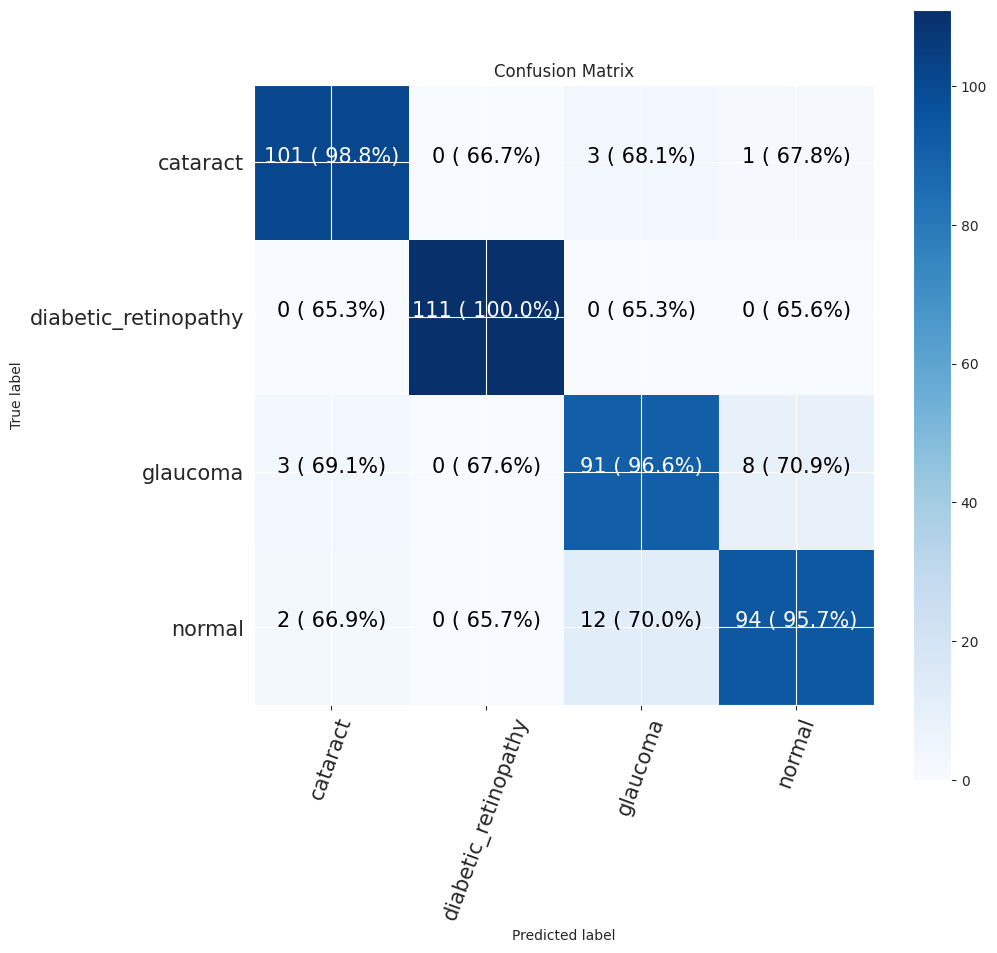

In [32]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


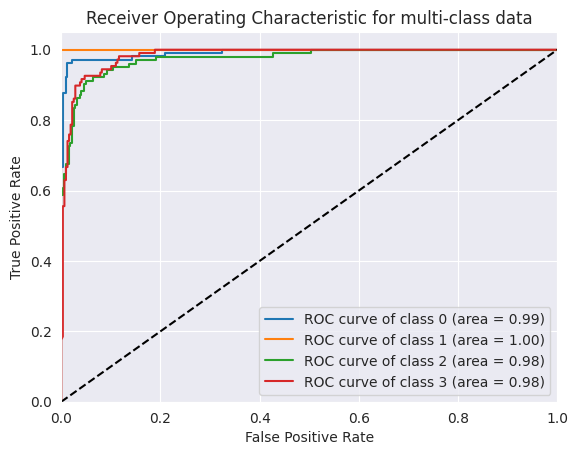

In [33]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [34]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [35]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

171446536/171446536 [==============================] - 1s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



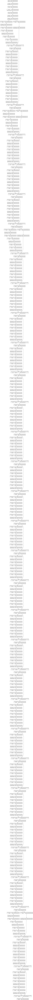

In [36]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [37]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_7 (Dense)             (None, 32)                65568     
                                                           

In [38]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [39]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 158s 714ms/step - loss: 0.6921 - accuracy: 0.7239 - val_loss: 0.5168 - val_accuracy: 0.7924 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 89s 425ms/step - loss: 0.4723 - accuracy: 0.8155 - val_loss: 0.4425 - val_accuracy: 0.8210 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 74s 352ms/step - loss: 0.4543 - accuracy: 0.8194 - val_loss: 0.5741 - val_accuracy: 0.7733 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 57s 267ms/step - loss: 0.4055 - accuracy: 0.8407 - val_loss: 0.5100 - val_accuracy: 0.8258 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 49s 230ms/step - loss: 0.4026 - accuracy: 0.8461 - val_loss: 0.5968 - val_accuracy: 0.7924 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 46s 217ms/step - loss: 0.3843 - accuracy: 0.8485 - val_loss: 0.5787 - val_accuracy: 0.8210 - lr: 0.0010
Epoch 7/20
211/211 [==============================]

ResNet101 Evaluation

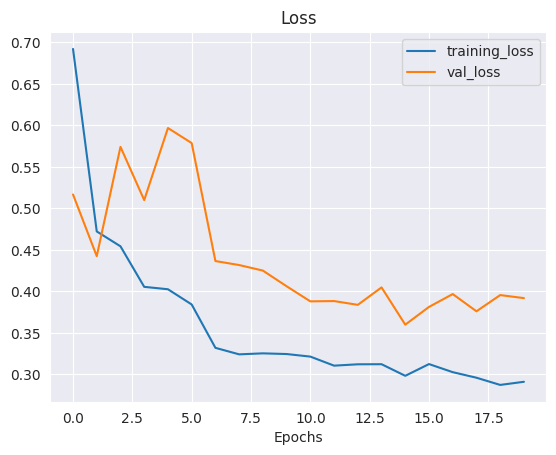

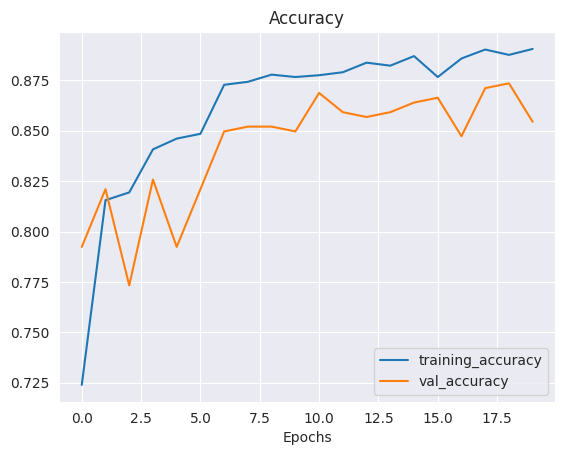

In [40]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 2s 82ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       105
           1       0.98      0.87      0.92       111
           2       0.83      0.75      0.78       102
           3       0.74      0.91      0.81       108

    accuracy                           0.86       426
   macro avg       0.87      0.86      0.86       426
weighted avg       0.87      0.86      0.86       426

Specificity: [0.28313253012048195, 0.2948328267477204, 0.21714285714285714, 0.29878048780487804]
Mean Squared Error: : 0.11702373623847961
The average AUC-ROC is 0.9777722521427883


[0.9660493827160493,
 0.6788990825688074,
 0.7155688622754491,
 0.6450511945392492,
 0.6604938271604939,
 0.9571865443425076,
 0.6706586826347305,
 0.6621160409556314,
 0.6975308641975309,
 0.6880733944954128,
 0.9221556886227545,
 0.726962457337884,
 0.6759259259259259,
 0.6758409785932722,
 0.6916167664670658,
 0.9658703071672355]

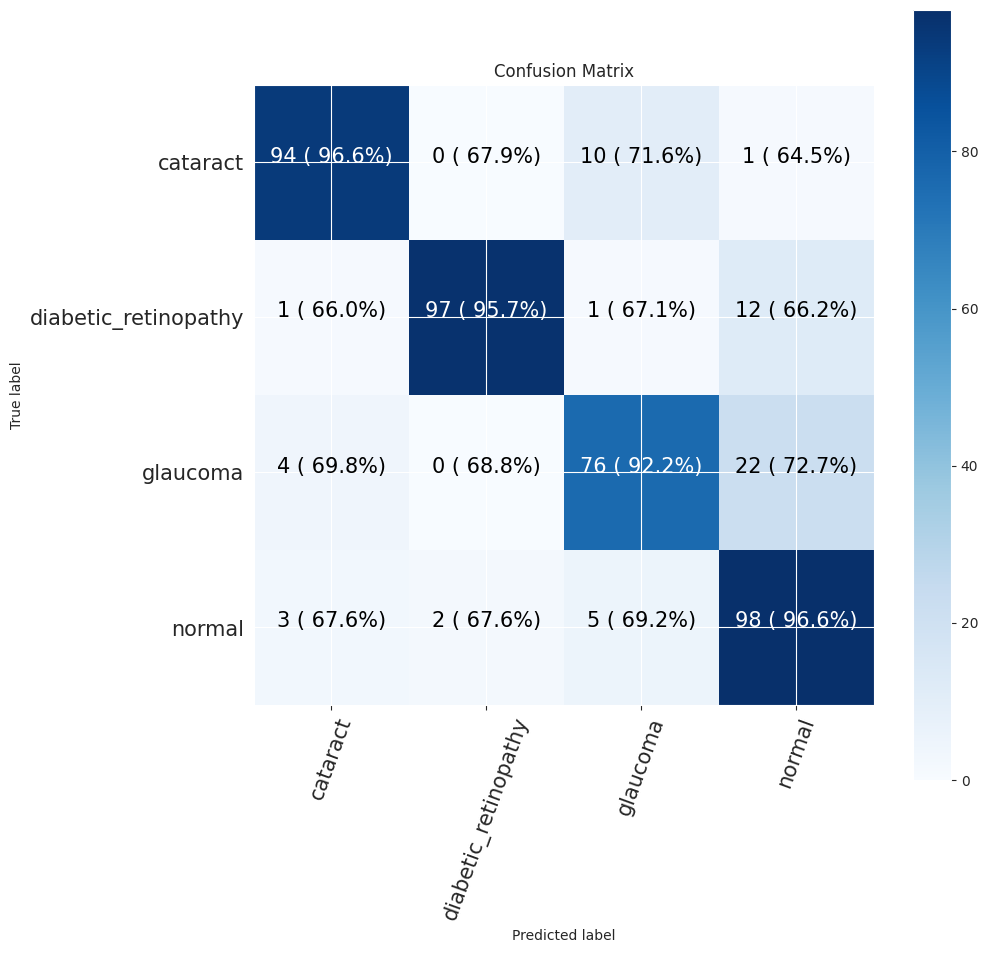

In [41]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


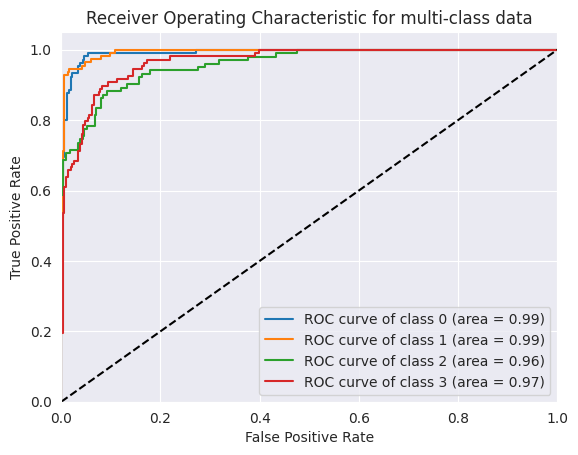

In [42]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 32**

In [119]:
epoch = 20
batchsize = 32

In [120]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


In [121]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [122]:
data_aug = tf.keras.Sequential([
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomFlip("horizontal")
],name = "data_augmentation_layer")

In [123]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **EfficientNetV2B3 Model**

In [48]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [49]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_3  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 32)                49184     
                                                           

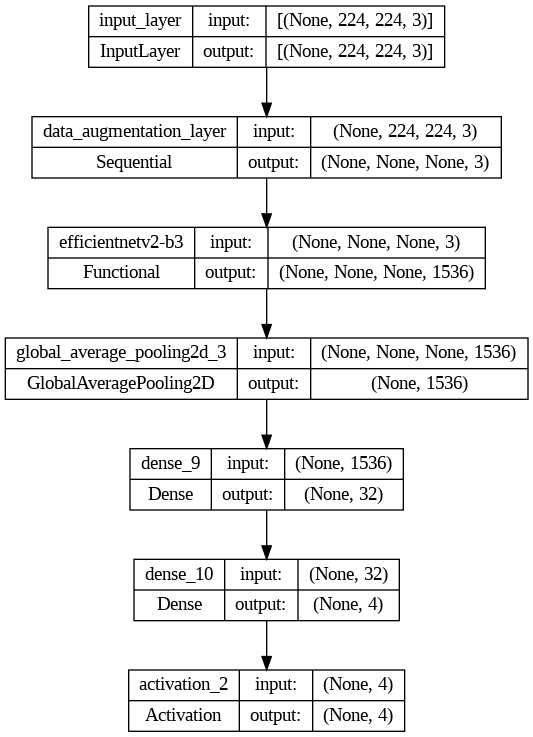

In [50]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [51]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [52]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 106s 886ms/step - loss: 0.7216 - accuracy: 0.7043 - val_loss: 0.6684 - val_accuracy: 0.7184 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 75s 709ms/step - loss: 0.5520 - accuracy: 0.7800 - val_loss: 0.6634 - val_accuracy: 0.7112 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 73s 687ms/step - loss: 0.4874 - accuracy: 0.8105 - val_loss: 0.5529 - val_accuracy: 0.7900 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 70s 652ms/step - loss: 0.4818 - accuracy: 0.8102 - val_loss: 0.5084 - val_accuracy: 0.7971 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 62s 584ms/step - loss: 0.4397 - accuracy: 0.8265 - val_loss: 0.4870 - val_accuracy: 0.8091 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 61s 573ms/step - loss: 0.4298 - accuracy: 0.8301 - val_loss: 0.6123 - val_accuracy: 0.7613 - lr: 0.0010
Epoch 7/20
106/106 [==============================]

EfficientNetV2B3 Evaluation

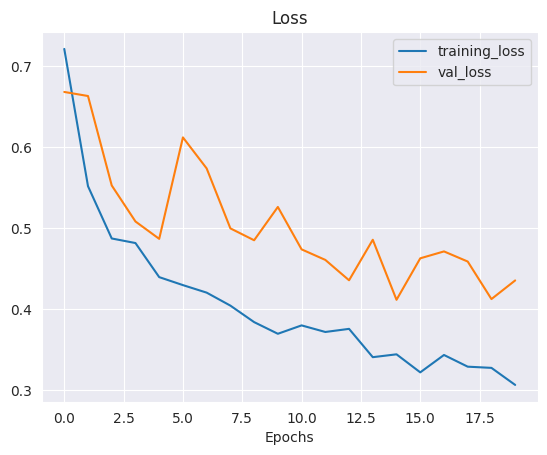

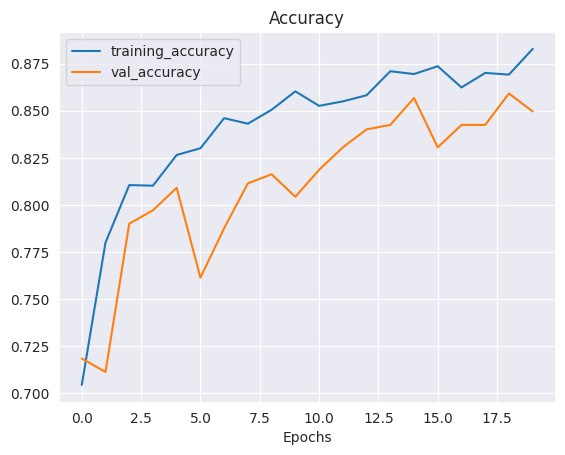

In [53]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 80ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       105
           1       0.90      0.91      0.91       111
           2       0.99      0.71      0.82       102
           3       0.74      0.94      0.83       108

    accuracy                           0.88       426
   macro avg       0.89      0.87      0.87       426
weighted avg       0.89      0.88      0.88       426

Specificity: [0.30275229357798167, 0.31076923076923074, 0.2033898305084746, 0.31076923076923074]
Mean Squared Error: : 0.11790677905082703
The average AUC-ROC is 0.975730704386977


[0.9813084112149533,
 0.6656050955414012,
 0.7053824362606232,
 0.6551724137931034,
 0.6542056074766355,
 0.9681528662420382,
 0.6855524079320113,
 0.6517241379310345,
 0.6947040498442367,
 0.6942675159235668,
 0.9150141643059491,
 0.7172413793103448,
 0.6697819314641744,
 0.6719745222929936,
 0.6940509915014165,
 0.9758620689655172]

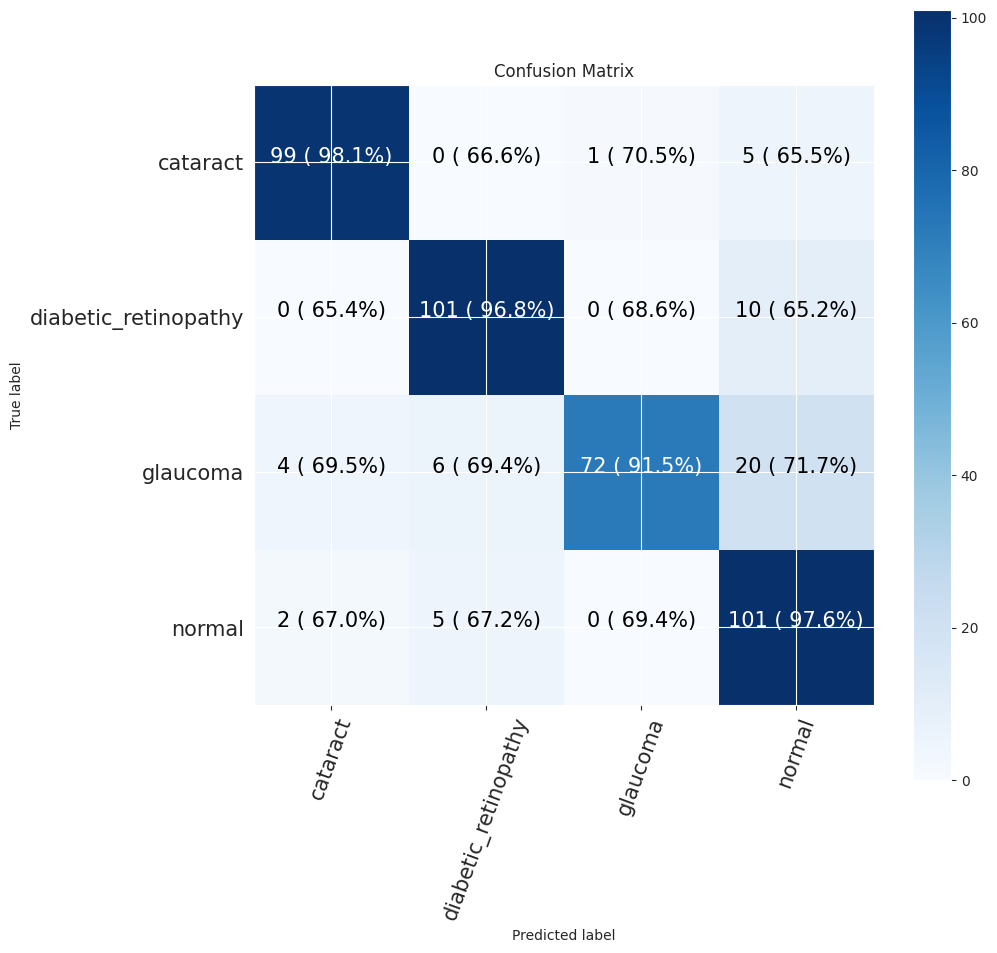

In [54]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


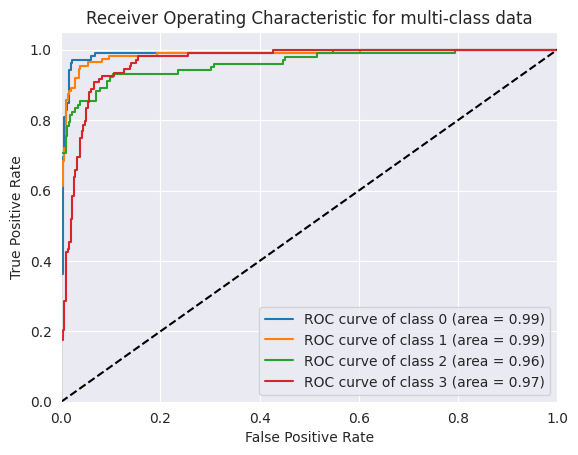

In [55]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [56]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

rbg = layers.Input(shape=(224, 224, 3))

rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 26, 26, 128)      

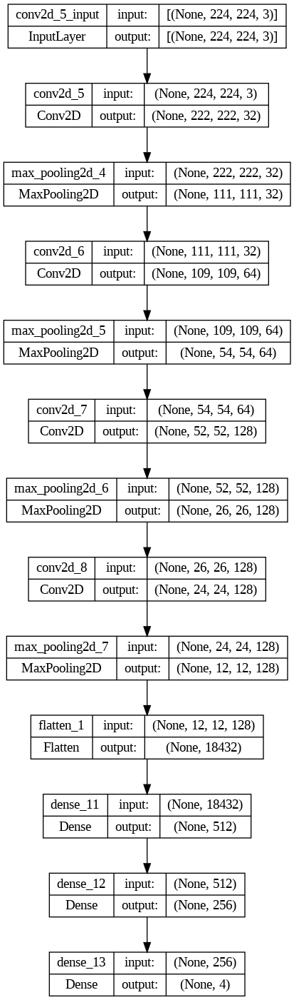

In [57]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [58]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [59]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 8s 40ms/step - loss: 1.5273 - accuracy: 0.5664 - val_loss: 0.2917 - val_accuracy: 0.7566 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 4s 39ms/step - loss: 0.2737 - accuracy: 0.7473 - val_loss: 0.2494 - val_accuracy: 0.7924 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 4s 39ms/step - loss: 0.2416 - accuracy: 0.7912 - val_loss: 0.2110 - val_accuracy: 0.8329 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 4s 40ms/step - loss: 0.2130 - accuracy: 0.8173 - val_loss: 0.2197 - val_accuracy: 0.7900 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 4s 39ms/step - loss: 0.1911 - accuracy: 0.8419 - val_loss: 0.2048 - val_accuracy: 0.8473 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 4s 39ms/step - loss: 0.1812 - accuracy: 0.8464 - val_loss: 0.1807 - val_accuracy: 0.8544 - lr: 0.0010
Epoch 7/20
106/106 [==============================] - 4s 39ms/st

CNN Evaluation

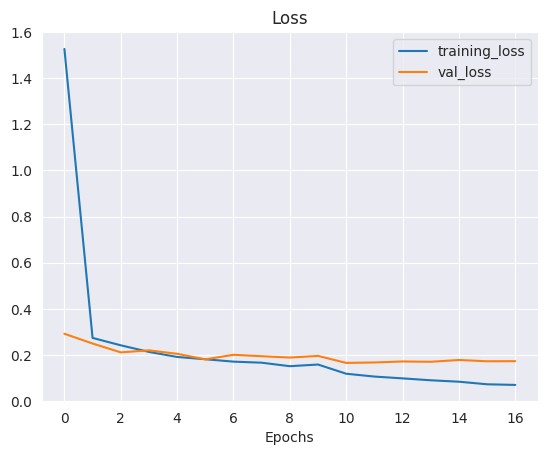

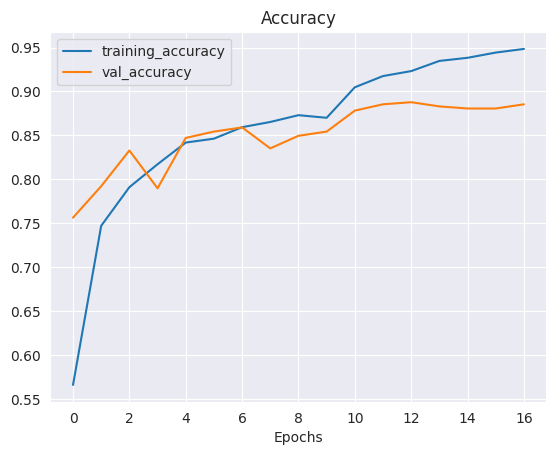

In [60]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 0s 18ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.85      0.86       105
           1       1.00      1.00      1.00       111
           2       0.78      0.78      0.78       102
           3       0.83      0.84      0.83       108

    accuracy                           0.87       426
   macro avg       0.87      0.87      0.87       426
weighted avg       0.87      0.87      0.87       426

Specificity: [0.26409495548961426, 0.3523809523809524, 0.23121387283236994, 0.2716417910447761]
Mean Squared Error: : 0.11317064613103867
The average AUC-ROC is 0.9623792534336001


[0.9504643962848297,
 0.6666666666666666,
 0.7037037037037037,
 0.689873417721519,
 0.6563467492260062,
 1.0,
 0.6574074074074074,
 0.6487341772151899,
 0.7151702786377709,
 0.6761904761904762,
 0.9320987654320988,
 0.7151898734177216,
 0.6780185758513931,
 0.6571428571428571,
 0.7067901234567902,
 0.9462025316455697]

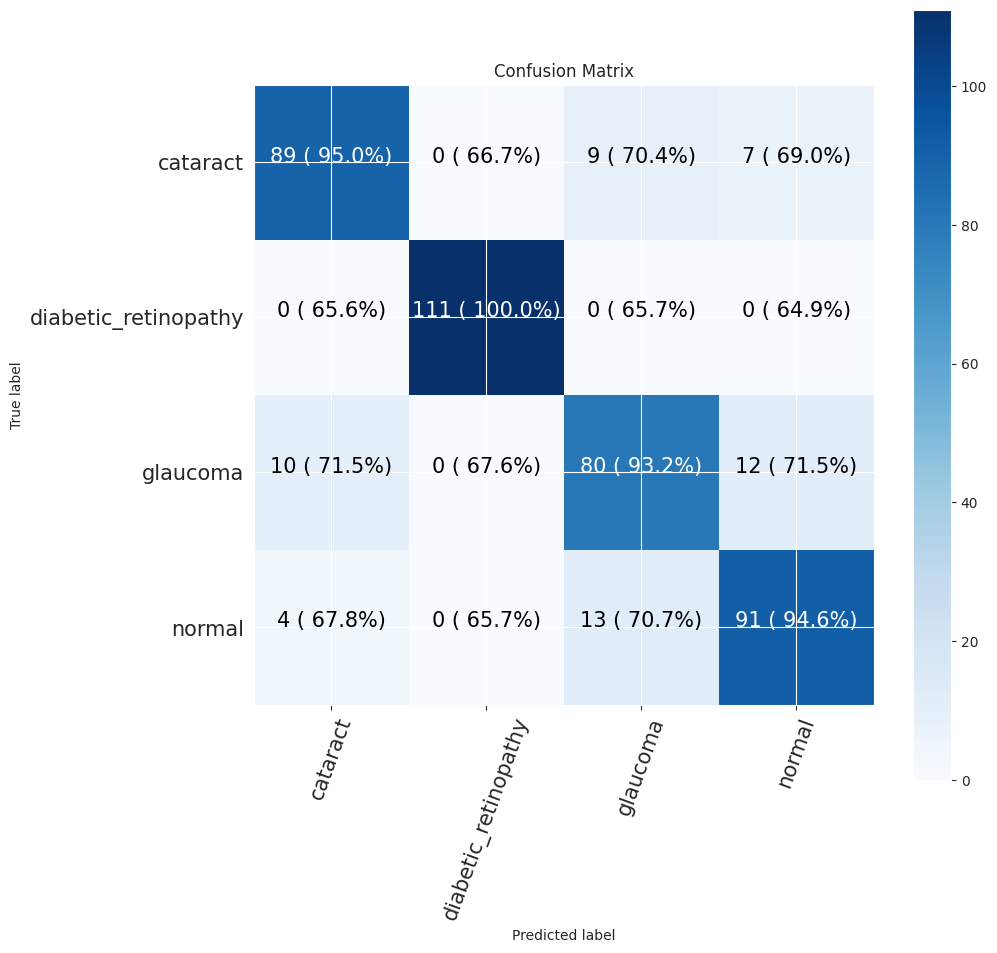

In [61]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


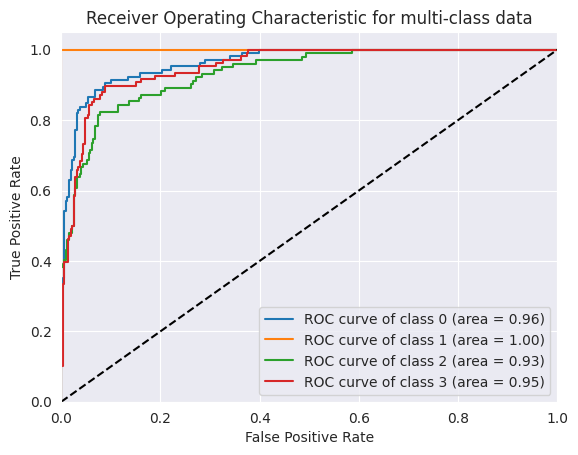

In [62]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [63]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [124]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_15 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_9  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_27 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_28 (Dense)            (None, 4)                 4100      
                                                           

In [125]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

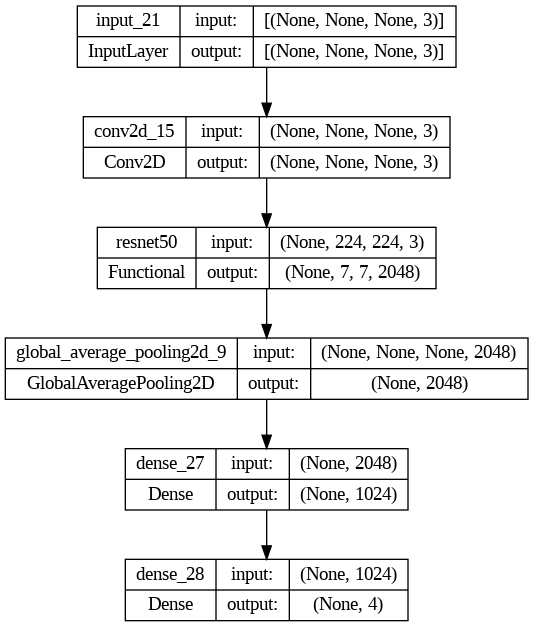

In [126]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [127]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [128]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 33s 266ms/step - loss: 0.3038 - accuracy: 0.7539 - val_loss: 0.2009 - val_accuracy: 0.8592 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 28s 264ms/step - loss: 0.1814 - accuracy: 0.8636 - val_loss: 0.1563 - val_accuracy: 0.9021 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 28s 261ms/step - loss: 0.1377 - accuracy: 0.8983 - val_loss: 0.1204 - val_accuracy: 0.9165 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 28s 259ms/step - loss: 0.1230 - accuracy: 0.9101 - val_loss: 0.1534 - val_accuracy: 0.8759 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 28s 261ms/step - loss: 0.1088 - accuracy: 0.9179 - val_loss: 0.1076 - val_accuracy: 0.9308 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 28s 260ms/step - loss: 0.0973 - accuracy: 0.9273 - val_loss: 0.1301 - val_accuracy: 0.9069 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

ResNet50 Evaluation

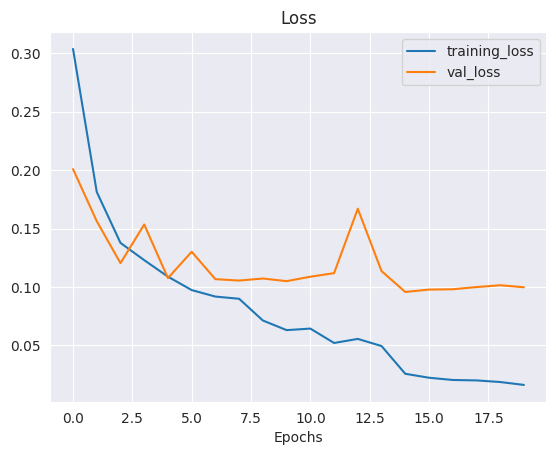

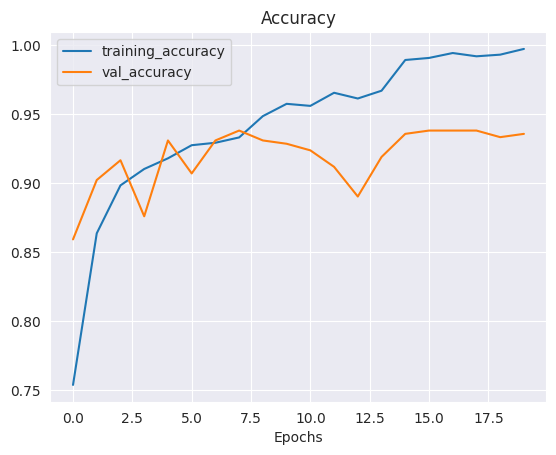

In [129]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 93ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       105
           1       1.00      0.98      0.99       111
           2       0.88      0.89      0.89       102
           3       0.91      0.89      0.90       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.3067484662576687, 0.3438485804416404, 0.2716417910447761, 0.2909090909090909]
Mean Squared Error: : 0.10309191048145294
The average AUC-ROC is 0.9875765927735126


[0.9842271293375394,
 0.668769716088328,
 0.6873065015479877,
 0.67601246105919,
 0.6498422712933754,
 0.9936908517350158,
 0.6594427244582043,
 0.6573208722741433,
 0.6908517350157729,
 0.6782334384858044,
 0.9659442724458205,
 0.7040498442367601,
 0.6750788643533123,
 0.6593059936908517,
 0.6873065015479877,
 0.9626168224299065]

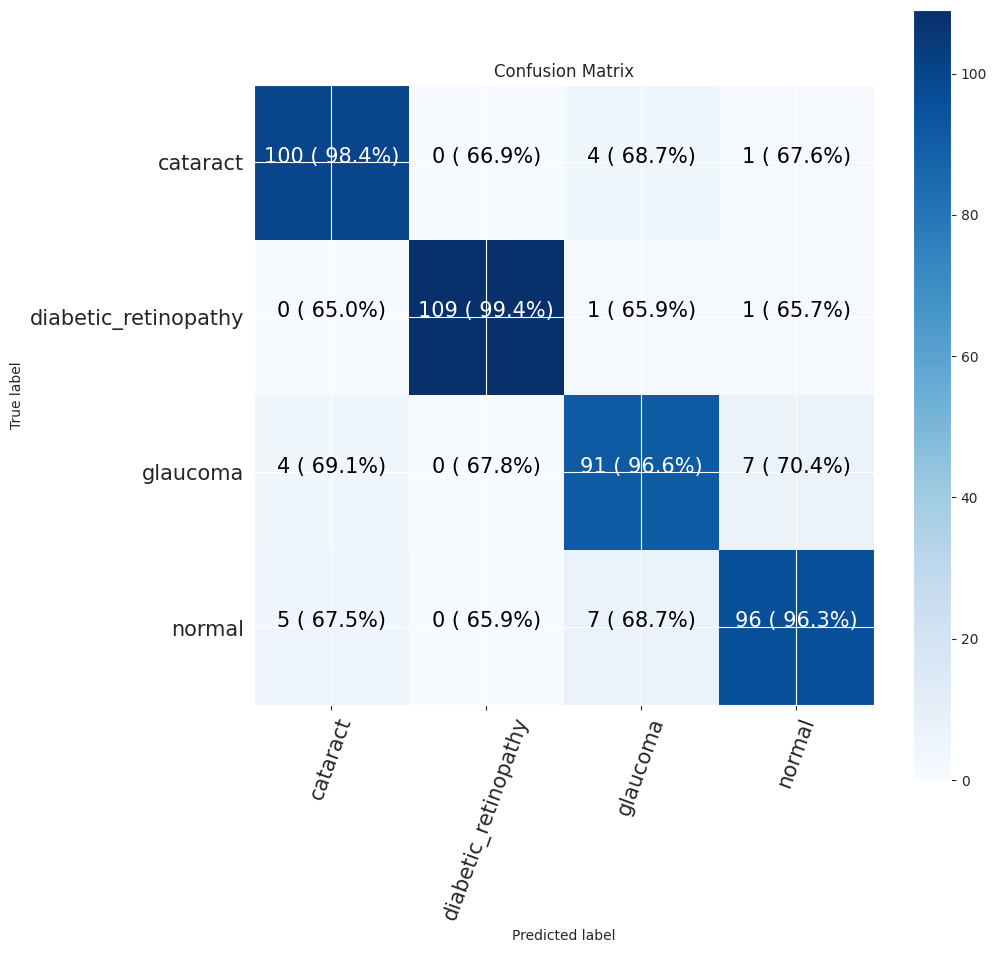

In [130]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


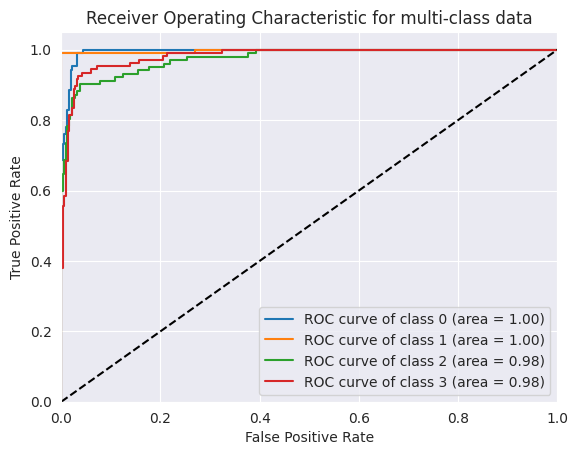

In [131]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [72]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [73]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



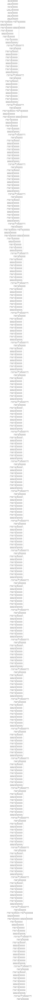

In [74]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [75]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_5  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_16 (Dense)            (None, 32)                65568     
                                                           

In [76]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [77]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 157s 1s/step - loss: 0.6976 - accuracy: 0.7233 - val_loss: 0.5515 - val_accuracy: 0.7685 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 104s 975ms/step - loss: 0.5154 - accuracy: 0.7995 - val_loss: 0.5887 - val_accuracy: 0.7757 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 74s 696ms/step - loss: 0.4356 - accuracy: 0.8271 - val_loss: 0.4943 - val_accuracy: 0.8043 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 66s 626ms/step - loss: 0.4153 - accuracy: 0.8339 - val_loss: 0.5703 - val_accuracy: 0.7900 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 58s 547ms/step - loss: 0.3855 - accuracy: 0.8493 - val_loss: 0.6480 - val_accuracy: 0.7566 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 59s 558ms/step - loss: 0.3987 - accuracy: 0.8440 - val_loss: 0.4768 - val_accuracy: 0.8234 - lr: 0.0010
Epoch 7/20
106/106 [==============================] -

ResNet50 Evaluation

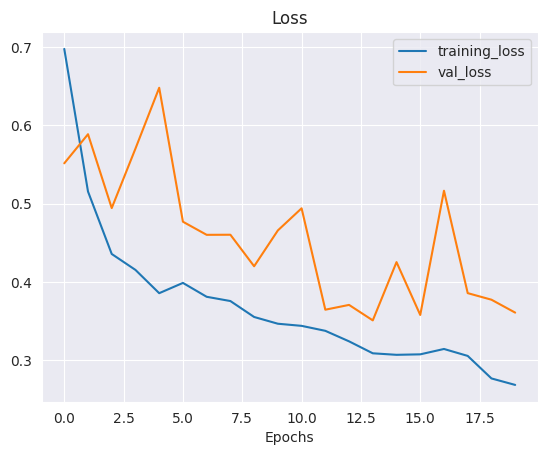

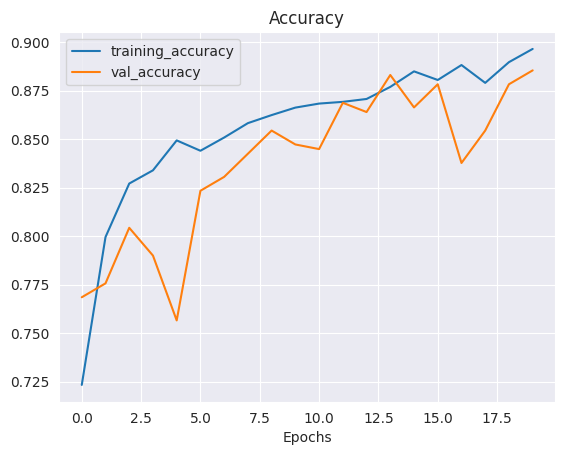

In [78]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 2s 158ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       105
           1       0.93      0.95      0.94       111
           2       0.87      0.77      0.82       102
           3       0.80      0.91      0.85       108

    accuracy                           0.88       426
   macro avg       0.89      0.88      0.88       426
weighted avg       0.89      0.88      0.88       426

Specificity: [0.27927927927927926, 0.33125, 0.2276657060518732, 0.29878048780487804]
Mean Squared Error: : 0.11364388465881348
The average AUC-ROC is 0.9806463166328401


[0.963302752293578,
 0.6634615384615384,
 0.7164179104477612,
 0.6611842105263158,
 0.6605504587155964,
 0.9839743589743589,
 0.6686567164179105,
 0.6513157894736842,
 0.6972477064220184,
 0.6826923076923077,
 0.9313432835820895,
 0.7203947368421053,
 0.6788990825688074,
 0.6698717948717948,
 0.6835820895522388,
 0.9671052631578947]

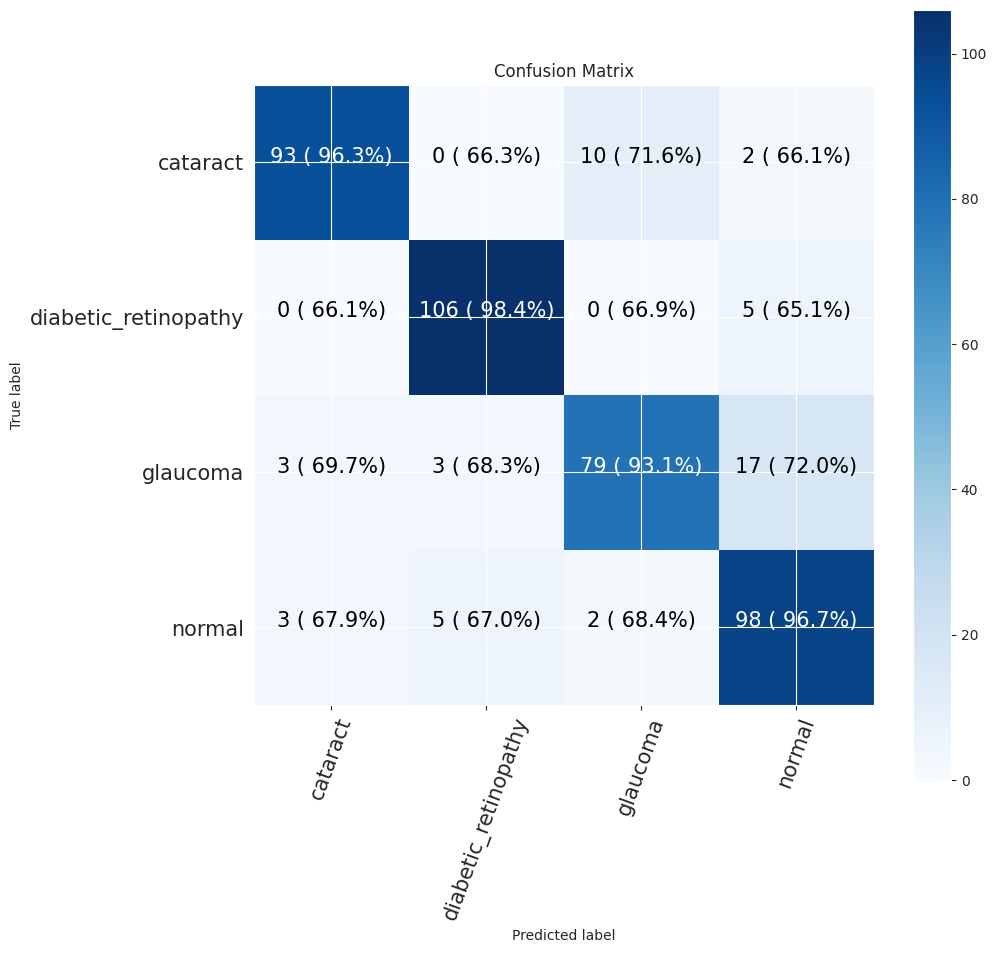

In [79]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


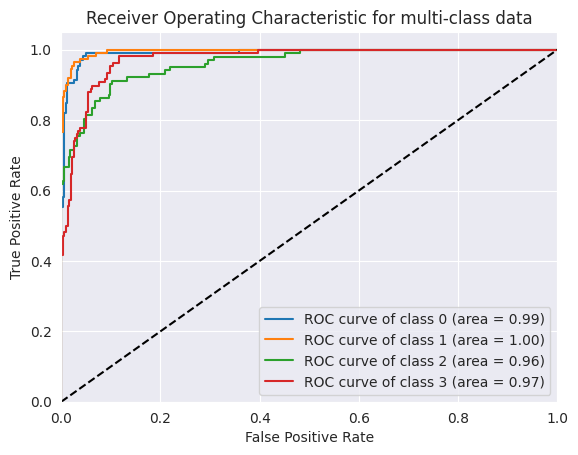

In [80]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 64**

In [81]:
epoch = 20
batchsize = 64

In [82]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


In [83]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [84]:
data_aug = tf.keras.Sequential([
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomFlip("horizontal")
],name = "data_augmentation_layer")

In [85]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **EfficientNetV2B3 Model**

In [86]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [87]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_6  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_18 (Dense)            (None, 32)                49184     
                                                           

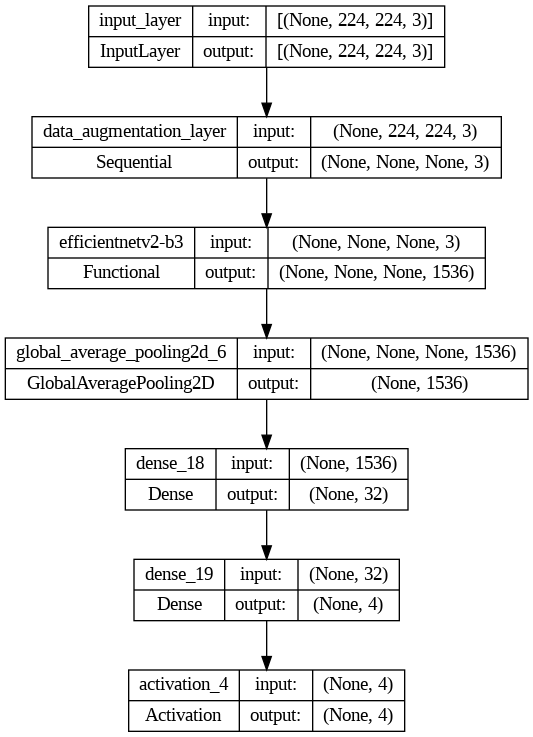

In [88]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [89]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [90]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 109s 2s/step - loss: 0.8273 - accuracy: 0.6557 - val_loss: 0.6448 - val_accuracy: 0.7375 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 77s 1s/step - loss: 0.5797 - accuracy: 0.7755 - val_loss: 0.5787 - val_accuracy: 0.7494 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 77s 1s/step - loss: 0.5114 - accuracy: 0.8069 - val_loss: 0.6907 - val_accuracy: 0.7232 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 73s 1s/step - loss: 0.5139 - accuracy: 0.8063 - val_loss: 0.5589 - val_accuracy: 0.7876 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 71s 1s/step - loss: 0.4605 - accuracy: 0.8224 - val_loss: 0.6061 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 63s 1s/step - loss: 0.4538 - accuracy: 0.8227 - val_loss: 0.6322 - val_accuracy: 0.7542 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 59s 1s/step - loss: 0.4294 - 

EfficientNetV2B3 Evaluation

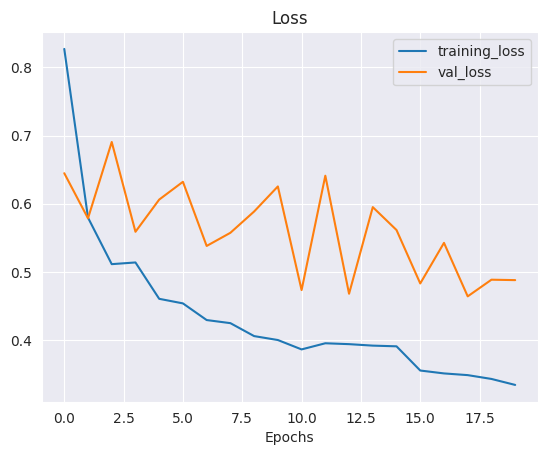

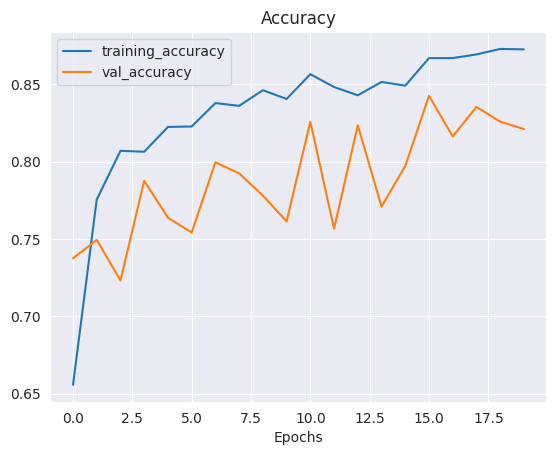

In [91]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 155ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       105
           1       0.81      0.98      0.89       111
           2       0.95      0.71      0.81       102
           3       0.77      0.81      0.79       108

    accuracy                           0.86       426
   macro avg       0.87      0.85      0.85       426
weighted avg       0.87      0.86      0.86       426

Specificity: [0.2909090909090909, 0.3438485804416404, 0.2033898305084746, 0.2603550295857988]
Mean Squared Error: : 0.12179173529148102
The average AUC-ROC is 0.9742196265682199


[0.9722222222222222,
 0.6404109589041096,
 0.7057142857142857,
 0.6858974358974359,
 0.6574074074074074,
 0.9931506849315068,
 0.6828571428571428,
 0.6506410256410257,
 0.7006172839506173,
 0.678082191780822,
 0.9142857142857143,
 0.7275641025641025,
 0.6697530864197531,
 0.6883561643835616,
 0.6971428571428572,
 0.9358974358974359]

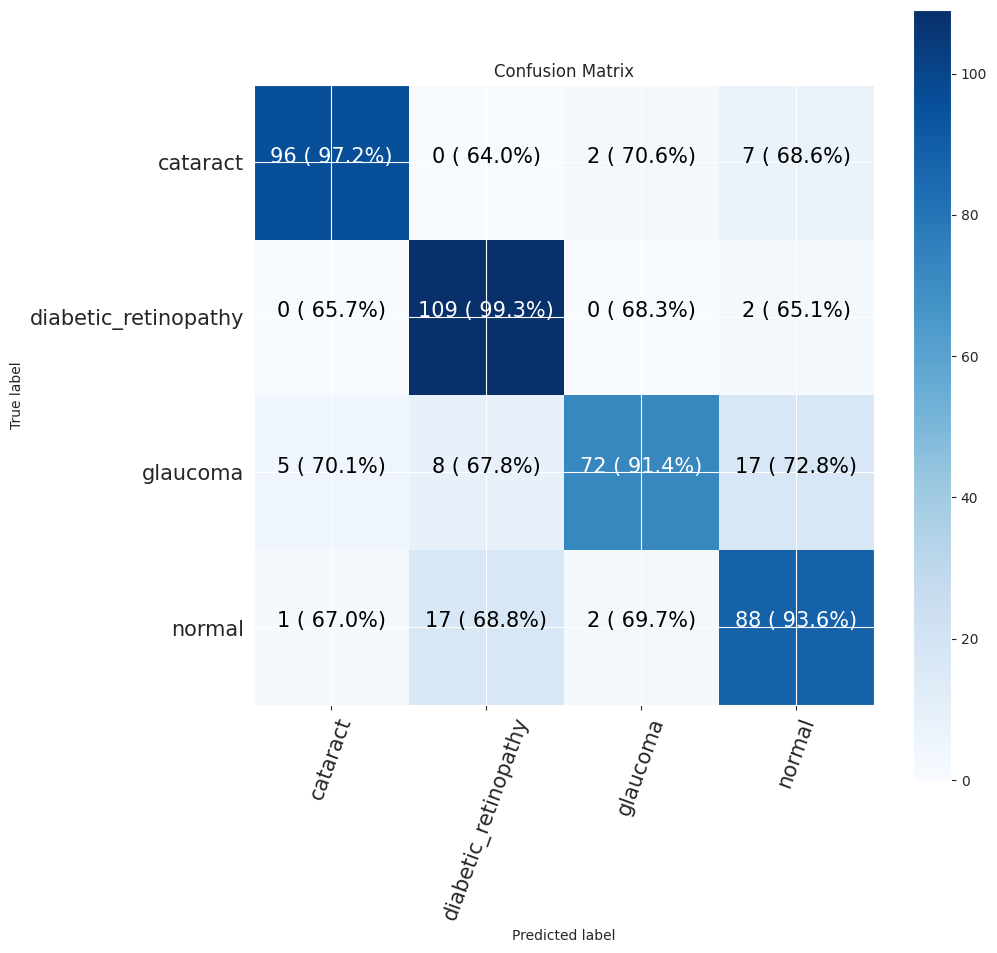

In [92]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


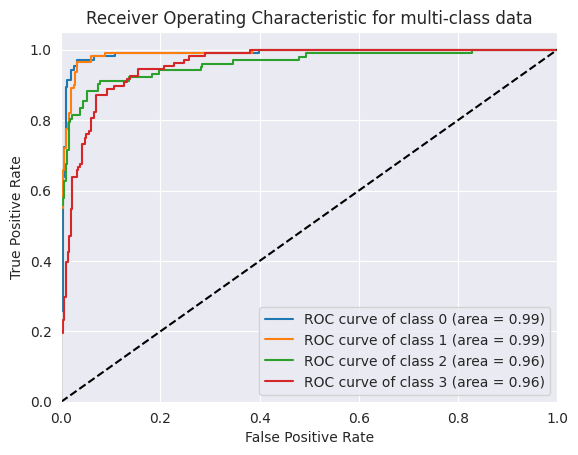

In [93]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [94]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

rbg = layers.Input(shape=(224, 224, 3))

rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 26, 26, 128)      

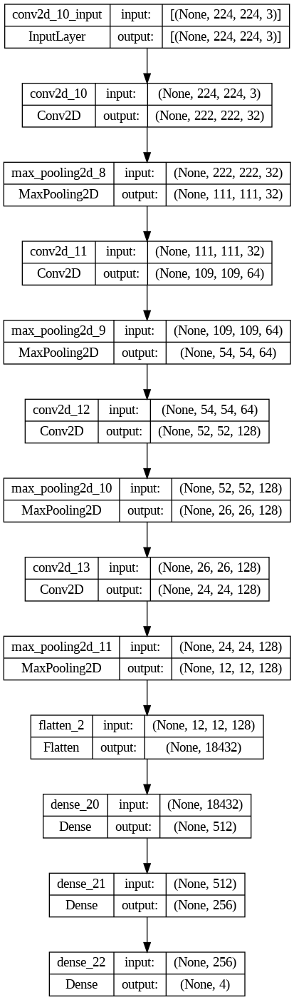

In [95]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [96]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [97]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 11s 122ms/step - loss: 2.6544 - accuracy: 0.5116 - val_loss: 0.4637 - val_accuracy: 0.6110 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 4s 75ms/step - loss: 0.3821 - accuracy: 0.6444 - val_loss: 0.3381 - val_accuracy: 0.7112 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 4s 74ms/step - loss: 0.2817 - accuracy: 0.7429 - val_loss: 0.2379 - val_accuracy: 0.8019 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 4s 75ms/step - loss: 0.2291 - accuracy: 0.7921 - val_loss: 0.2069 - val_accuracy: 0.8186 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 4s 75ms/step - loss: 0.2186 - accuracy: 0.8046 - val_loss: 0.2046 - val_accuracy: 0.8067 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 4s 75ms/step - loss: 0.1919 - accuracy: 0.8351 - val_loss: 0.1984 - val_accuracy: 0.8258 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 4s 75ms/step - loss: 0

CNN Evaluation

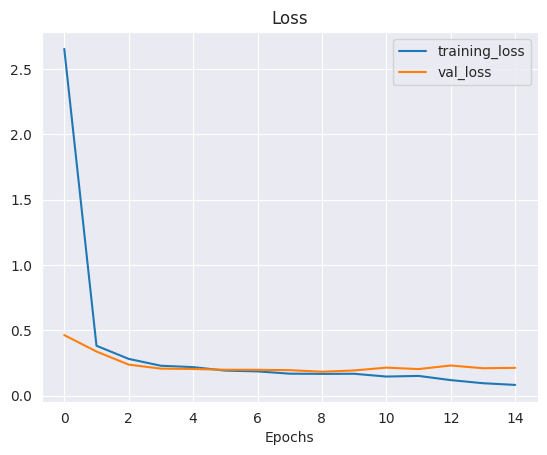

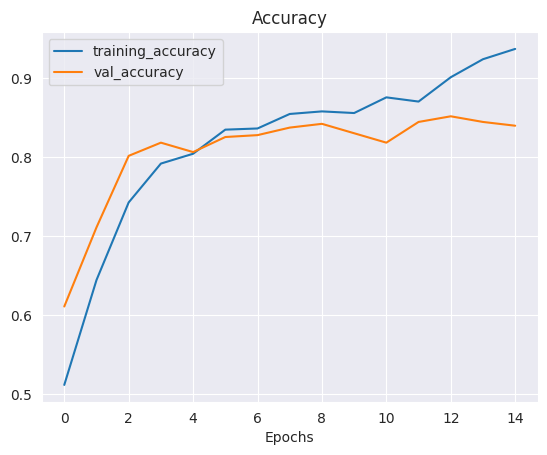

In [98]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 34ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.86      0.83       105
           1       0.98      0.99      0.99       111
           2       0.77      0.73      0.75       102
           3       0.84      0.82      0.83       108

    accuracy                           0.85       426
   macro avg       0.85      0.85      0.85       426
weighted avg       0.85      0.85      0.85       426

Specificity: [0.26785714285714285, 0.34810126582278483, 0.21022727272727273, 0.26409495548961426]
Mean Squared Error: : 0.11473613232374191
The average AUC-ROC is 0.9563230070469416


[0.9522292993630573,
 0.6656050955414012,
 0.7121212121212122,
 0.6875,
 0.6464968152866242,
 0.9968152866242038,
 0.6666666666666666,
 0.653125,
 0.7229299363057324,
 0.678343949044586,
 0.9151515151515152,
 0.71875,
 0.678343949044586,
 0.6592356687898089,
 0.706060606060606,
 0.940625]

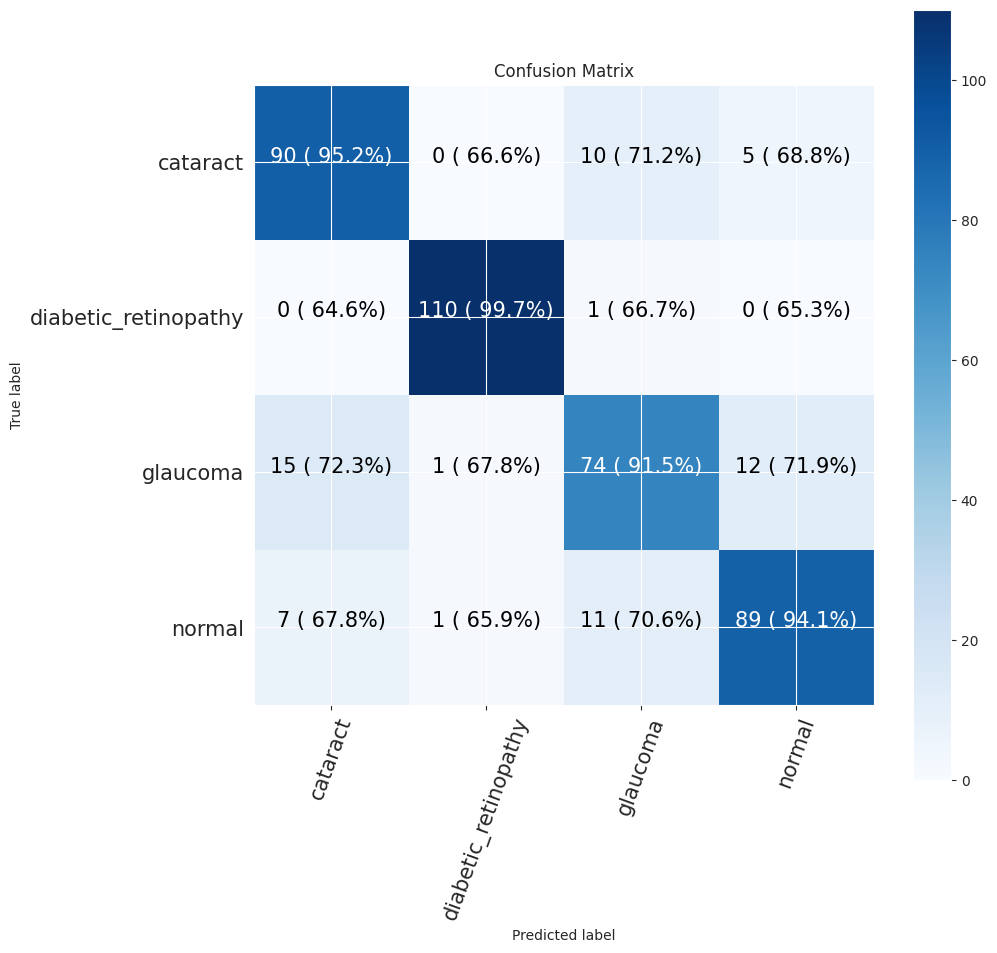

In [99]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


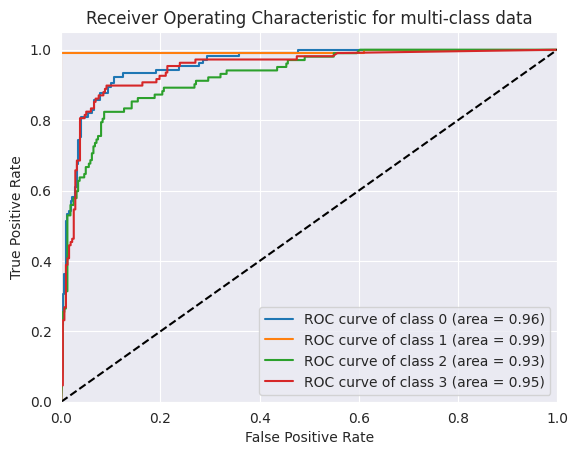

In [100]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [101]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [102]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_14 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_7  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_23 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_24 (Dense)            (None, 4)                 4100      
                                                           

In [103]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

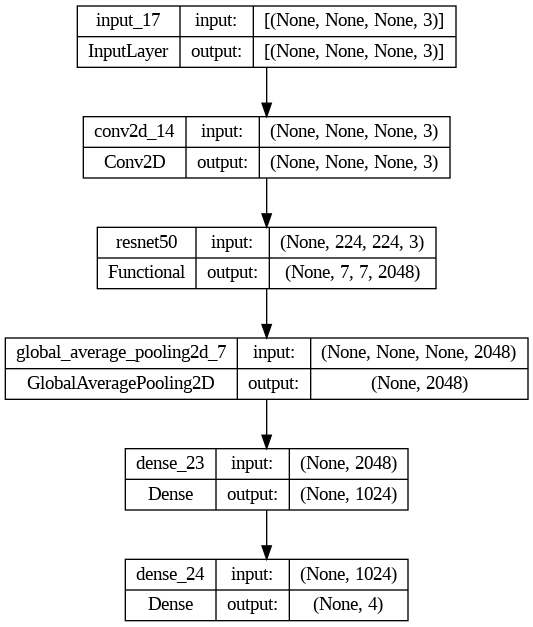

In [104]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [105]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [106]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 48s 680ms/step - loss: 0.3121 - accuracy: 0.7574 - val_loss: 0.1876 - val_accuracy: 0.8544 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 27s 506ms/step - loss: 0.1838 - accuracy: 0.8588 - val_loss: 0.1581 - val_accuracy: 0.8831 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 27s 503ms/step - loss: 0.1538 - accuracy: 0.8837 - val_loss: 0.1432 - val_accuracy: 0.8926 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 27s 507ms/step - loss: 0.1237 - accuracy: 0.9084 - val_loss: 0.1448 - val_accuracy: 0.8974 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 27s 508ms/step - loss: 0.1133 - accuracy: 0.9113 - val_loss: 0.1419 - val_accuracy: 0.8926 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 27s 506ms/step - loss: 0.1092 - accuracy: 0.9184 - val_loss: 0.1293 - val_accuracy: 0.9141 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 27s 506ms/st

ResNet50 Evaluation

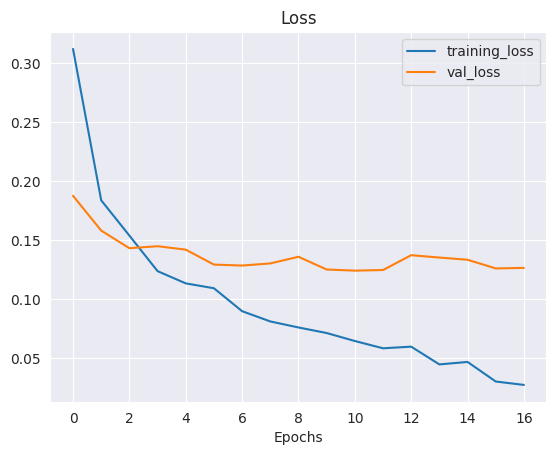

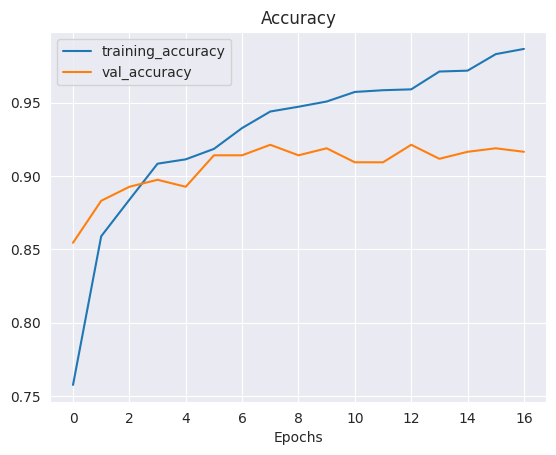

In [107]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 184ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       105
           1       1.00      0.97      0.99       111
           2       0.84      0.83      0.84       102
           3       0.85      0.86      0.85       108

    accuracy                           0.90       426
   macro avg       0.90      0.90      0.90       426
weighted avg       0.90      0.90      0.90       426

Specificity: [0.30275229357798167, 0.33962264150943394, 0.24926686217008798, 0.27927927927927926]
Mean Squared Error: : 0.10605770349502563
The average AUC-ROC is 0.9846218893692466


[0.9811912225705329,
 0.6698113207547169,
 0.6861538461538461,
 0.6772151898734177,
 0.6520376175548589,
 0.9905660377358491,
 0.6646153846153846,
 0.6518987341772152,
 0.6927899686520376,
 0.6792452830188679,
 0.9476923076923077,
 0.7183544303797469,
 0.6739811912225705,
 0.660377358490566,
 0.7015384615384616,
 0.9525316455696202]

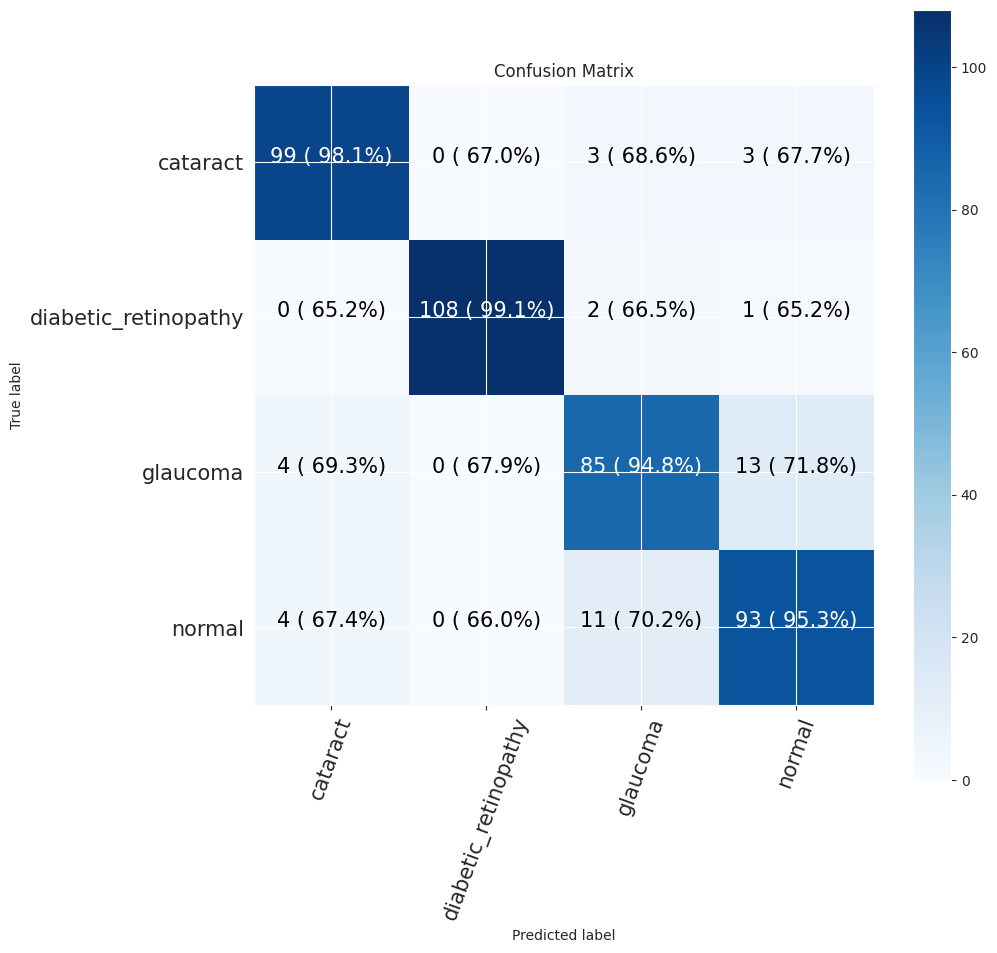

In [108]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


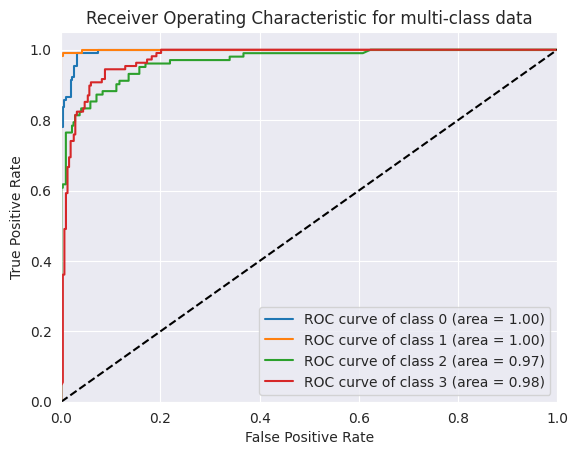

In [109]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [110]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [111]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



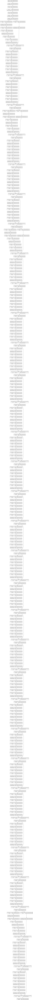

In [112]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [113]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_8  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_25 (Dense)            (None, 32)                65568     
                                                           

In [114]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [115]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 173s 3s/step - loss: 0.7635 - accuracy: 0.6895 - val_loss: 0.5613 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 119s 2s/step - loss: 0.5226 - accuracy: 0.7930 - val_loss: 0.4906 - val_accuracy: 0.8043 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 106s 2s/step - loss: 0.4723 - accuracy: 0.8138 - val_loss: 0.4710 - val_accuracy: 0.8019 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 89s 2s/step - loss: 0.4282 - accuracy: 0.8354 - val_loss: 0.4774 - val_accuracy: 0.8115 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 78s 1s/step - loss: 0.4193 - accuracy: 0.8307 - val_loss: 0.4671 - val_accuracy: 0.8282 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 67s 1s/step - loss: 0.4024 - accuracy: 0.8369 - val_loss: 0.4865 - val_accuracy: 0.8091 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 69s 1s/step - loss: 0.4045 

ResNet50 Evaluation

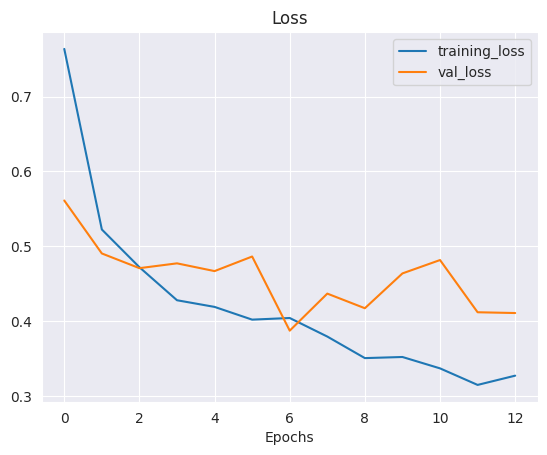

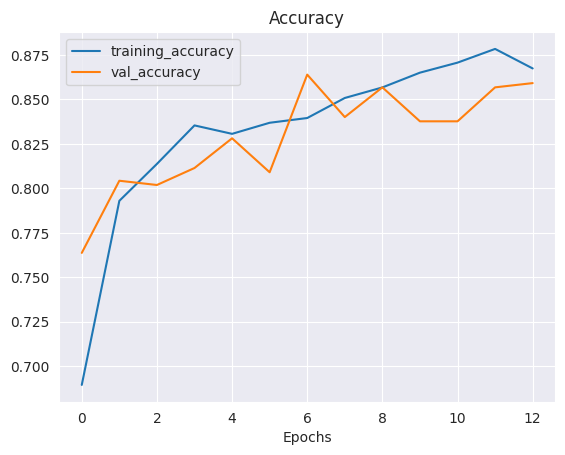

In [116]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 2s 298ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.85      0.89       105
           1       0.95      0.87      0.91       111
           2       0.78      0.78      0.78       102
           3       0.76      0.89      0.82       108

    accuracy                           0.85       426
   macro avg       0.86      0.85      0.85       426
weighted avg       0.86      0.85      0.85       426

Specificity: [0.26409495548961426, 0.2948328267477204, 0.23121387283236994, 0.2909090909090909]
Mean Squared Error: : 0.11851725727319717
The average AUC-ROC is 0.9740764247000179


[0.9516616314199395,
 0.6759259259259259,
 0.7222222222222222,
 0.6521739130434783,
 0.6676737160120846,
 0.9567901234567902,
 0.6604938271604939,
 0.6688963210702341,
 0.6978851963746223,
 0.691358024691358,
 0.9320987654320988,
 0.7190635451505016,
 0.6827794561933535,
 0.6759259259259259,
 0.6851851851851852,
 0.959866220735786]

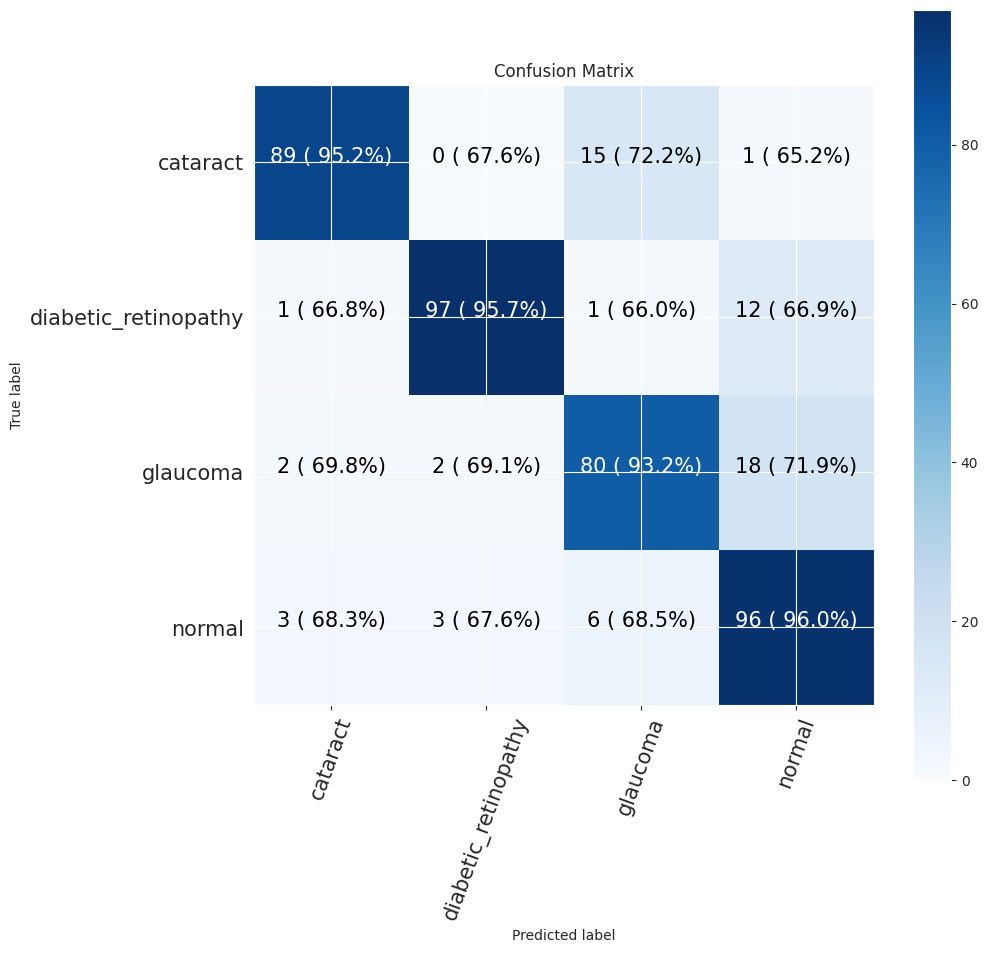

In [117]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


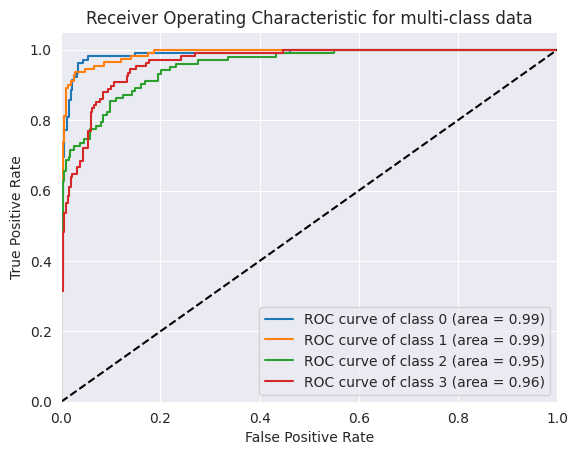

In [118]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()